# Question 2

In [53]:
import warnings
warnings.filterwarnings('ignore')

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.svm import SVR
from sklearn.model_selection import train_test_split


from sklearn.metrics import r2_score, mean_absolute_error
from sklearn.preprocessing import OneHotEncoder, StandardScaler




In [47]:
df = pd.read_csv("Bengaluru_House_Data.csv")
df.shape

(13320, 9)

In [48]:
df.head()

,area_type,availability,location,size,society,total_sqft,bath,balcony,price
0,Super built-up Area,19-Dec,Electronic City Phase II,2 BHK,Coomee,1056,2.0,1.0,39.07
1,Plot Area,Ready To Move,Chikka Tirupathi,4 Bedroom,Theanmp,2600,5.0,3.0,120.00
2,Built-up Area,Ready To Move,Uttarahalli,3 BHK,NaN,1440,2.0,3.0,62.00
3,Super built-up Area,Ready To Move,Lingadheeranahalli,3 BHK,Soiewre,1521,3.0,1.0,95.00
4,Super built-up Area,Ready To Move,Kothanur,2 BHK,NaN,1200,2.0,1.0,51.00


In [49]:
df.tail()

,area_type,availability,location,size,society,total_sqft,bath,balcony,price
13315,Built-up Area,Ready To Move,Whitefield,5 Bedroom,ArsiaEx,3453,4.0,0.0,231.0
13316,Super built-up Area,Ready To Move,Richards Town,4 BHK,NaN,3600,5.0,NaN,400.0
13317,Built-up Area,Ready To Move,Raja Rajeshwari Nagar,2 BHK,Mahla T,1141,2.0,1.0,60.0
13318,Super built-up Area,18-Jun,Padmanabhanagar,4 BHK,SollyCl,4689,4.0,1.0,488.0
13319,Super built-up Area,Ready To Move,Doddathoguru,1 BHK,NaN,550,1.0,1.0,17.0


In [50]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13320 entries, 0 to 13319
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   area_type     13320 non-null  object 
 1   availability  13320 non-null  object 
 2   location      13319 non-null  object 
 3   size          13304 non-null  object 
 4   society       7818 non-null   object 
 5   total_sqft    13320 non-null  object 
 6   bath          13247 non-null  float64
 7   balcony       12711 non-null  float64
 8   price         13320 non-null  float64
dtypes: float64(3), object(6)
memory usage: 936.7+ KB


In [76]:
df.columns

Index(['area_type', 'availability', 'location', 'size', 'society',
       'total_sqft', 'bath', 'balcony', 'price'],
      dtype='object')

In [78]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
bath,13247.0,2.692610,1.341458,1.0,2.0,2.0,3.0,40.0
balcony,12711.0,1.584376,0.817263,0.0,1.0,2.0,2.0,3.0
price,13320.0,112.565627,148.971674,8.0,50.0,72.0,120.0,3600.0


In [80]:
#Checking if there is some null values or not
df.isnull().sum()

area_type          0
availability       0
location           1
size              16
society         5502
total_sqft         0
bath              73
balcony          609
price              0
dtype: int64

In [82]:
#Performing Group by operation on Area Type
df.groupby("area_type")["area_type"].agg("count")

area_type
Built-up  Area          2418
Carpet  Area              87
Plot  Area              2025
Super built-up  Area    8790
Name: area_type, dtype: int64

In [83]:
#Checking what different "Area Types" are present in the Dataset
df['area_type'].unique()

array(['Super built-up  Area', 'Plot  Area', 'Built-up  Area',
       'Carpet  Area'], dtype=object)

### Data Visualization

<Axes: xlabel='area_type'>

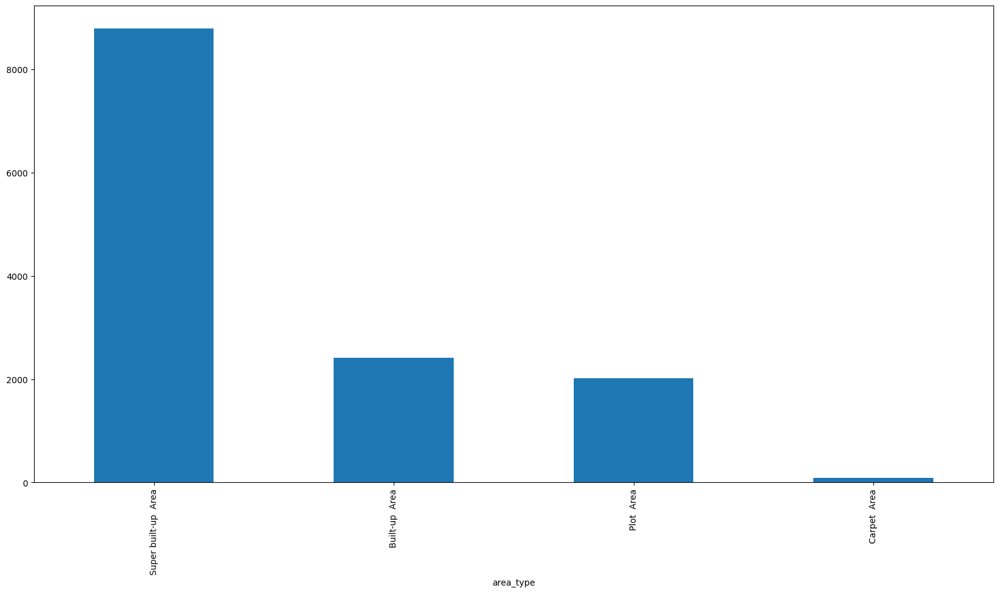

In [94]:
plt.figure(figsize=(20,10))
df.area_type.value_counts().plot(kind = 'bar')

In [85]:
df['bath'].unique()

array([ 2.,  5.,  3.,  4.,  6.,  1.,  9., nan,  8.,  7., 11., 10., 14.,
       27., 12., 16., 40., 15., 13., 18.])

<Axes: xlabel='bath'>

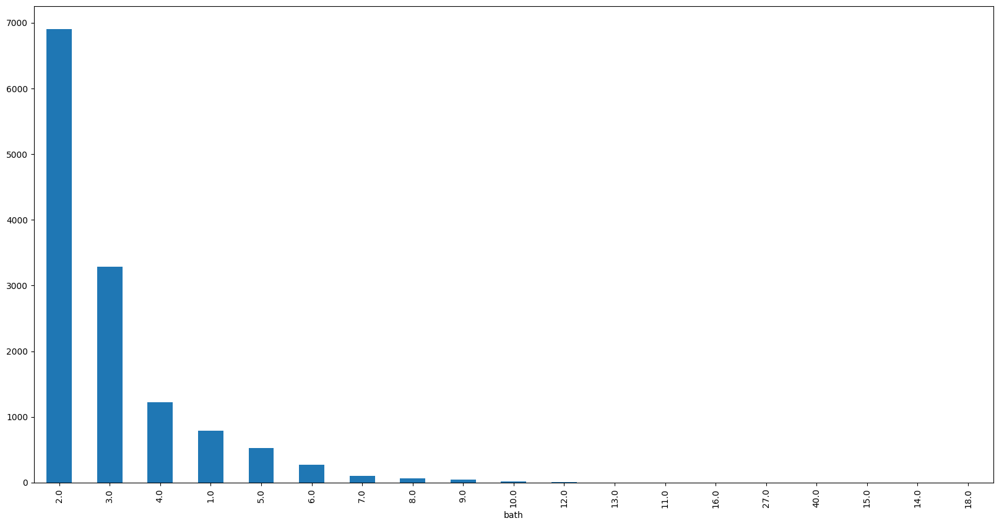

In [93]:
plt.figure(figsize=(20,10))
df.bath.value_counts().plot(kind='bar')

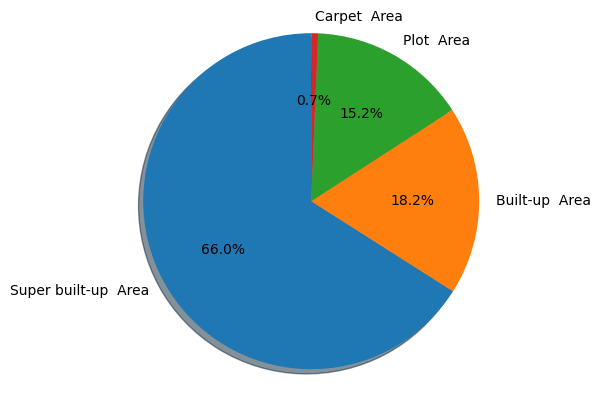

In [88]:
# Calculate value counts for the "area_type" column
area_type_counts = df["area_type"].value_counts()

# Plot a pie chart with percentage labels and other customizations
plt.pie(area_type_counts, labels=area_type_counts.index, autopct="%.1f%%", shadow=True, startangle=90)
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle
plt.show()

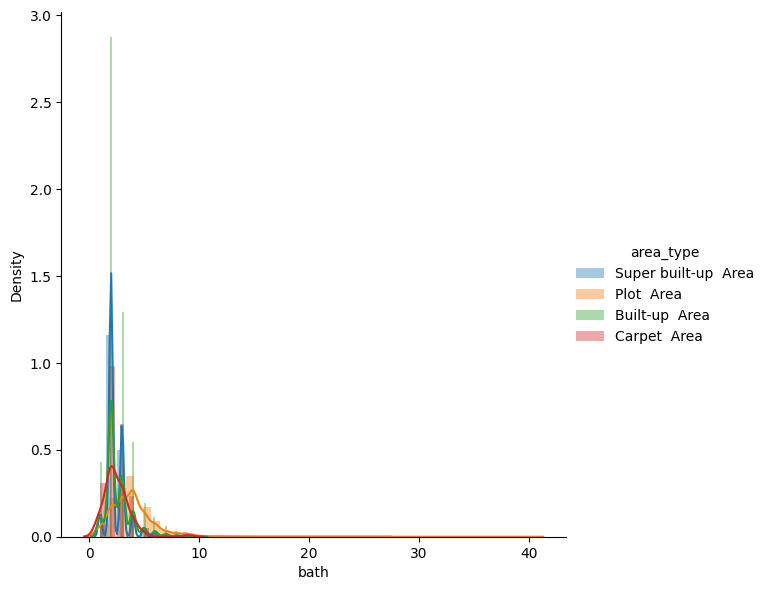

In [92]:
sns.FacetGrid(df, hue='area_type',height = 6).map(sns.distplot,'bath').add_legend()

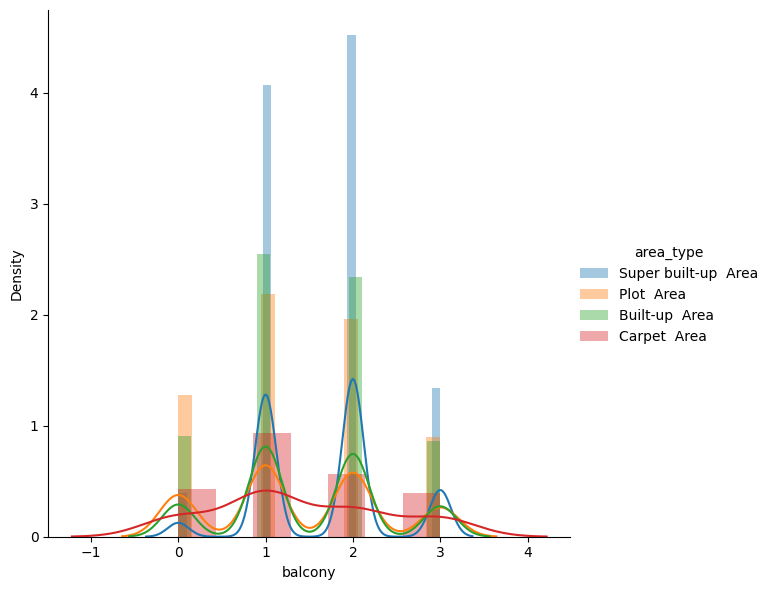

In [91]:
sns.FacetGrid(df, hue='area_type', height= 6).map(sns.distplot, 'balcony').add_legend()

### Data Cleaning
Dropping less important features



In [96]:
df = df.drop(["area_type", "availability", "balcony", "society"], axis= 1)
df

,location,size,total_sqft,bath,price
0,Electronic City Phase II,2 BHK,1056,2.0,39.070
1,Chikka Tirupathi,4 Bedroom,2600,5.0,120.000
2,Uttarahalli,3 BHK,1440,2.0,62.000
3,Lingadheeranahalli,3 BHK,1521,3.0,95.000
4,Kothanur,2 BHK,1200,2.0,51.000
5,Whitefield,2 BHK,1170,2.0,38.000
6,Old Airport Road,4 BHK,2732,4.0,204.000
7,Rajaji Nagar,4 BHK,3300,4.0,600.000
8,Marathahalli,3 BHK,1310,3.0,63.250
9,Gandhi Bazar,6 Bedroom,1020,6.0,370.000


In [97]:
df.shape

(13320, 5)

In [98]:
df.isna().sum()

location       1
size          16
total_sqft     0
bath          73
price          0
dtype: int64

In [99]:
df= df.dropna()

In [100]:
df.isna().sum()


location      0
size          0
total_sqft    0
bath          0
price         0
dtype: int64

In [101]:
df.shape

(13246, 5)

### Feauture Engineering

In [102]:
df['size'].unique()

array(['2 BHK', '4 Bedroom', '3 BHK', '4 BHK', '6 Bedroom', '3 Bedroom',
       '1 BHK', '1 RK', '1 Bedroom', '8 Bedroom', '2 Bedroom',
       '7 Bedroom', '5 BHK', '7 BHK', '6 BHK', '5 Bedroom', '11 BHK',
       '9 BHK', '9 Bedroom', '27 BHK', '10 Bedroom', '11 Bedroom',
       '10 BHK', '19 BHK', '16 BHK', '43 Bedroom', '14 BHK', '8 BHK',
       '12 Bedroom', '13 BHK', '18 Bedroom'], dtype=object)

Based on the above information provided, it is evident that the "Bedroom" attribute is represented using two different methods: "BHK" and "Bedroom." To address this inconsistency, a new column named "BHK" is being created, and all units, such as "BHK" and "Bedroom," will be removed or discarded.

Add new column for BHK (Bathrooms Hall Kitchen)

In [103]:
df['BHK']= df['size'].apply(lambda x : int(x.split(' ')[0]) )

In [105]:
df.head()

,location,size,total_sqft,bath,price,BHK
0,Electronic City Phase II,2 BHK,1056,2.0,39.07,2
1,Chikka Tirupathi,4 Bedroom,2600,5.0,120.00,4
2,Uttarahalli,3 BHK,1440,2.0,62.00,3
3,Lingadheeranahalli,3 BHK,1521,3.0,95.00,3
4,Kothanur,2 BHK,1200,2.0,51.00,2


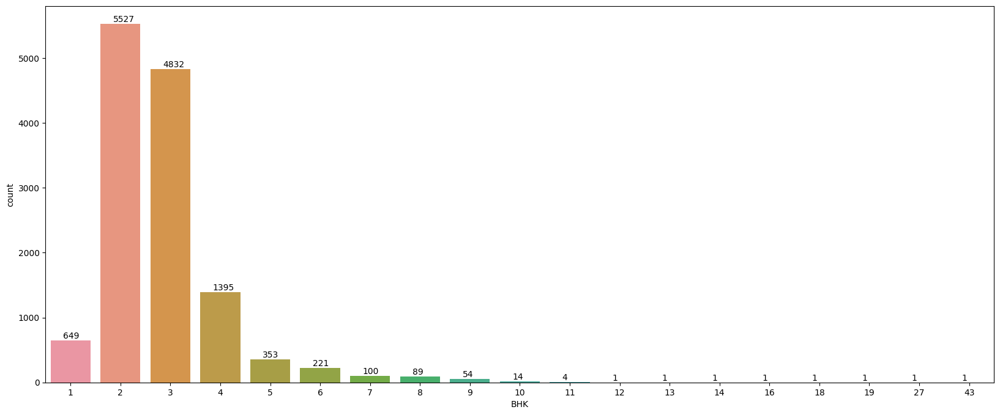

In [106]:
plt.figure(figsize=(20,8))
ax = sns.countplot(x= 'BHK', data= df)
for p in ax.patches:
    ax.annotate(int(p.get_height()), (p.get_x()+0.25, p.get_height()+1), va='bottom', color='black')

In [107]:
df['BHK'].unique()

array([ 2,  4,  3,  6,  1,  8,  7,  5, 11,  9, 27, 10, 19, 16, 43, 14, 12,
       13, 18], dtype=int64)

In [109]:
df[df.BHK > 20]

,location,size,total_sqft,bath,price,BHK
1718,2Electronic City Phase II,27 BHK,8000,27.0,230.0,27
4684,Munnekollal,43 Bedroom,2400,40.0,660.0,43


In [110]:
df.total_sqft.unique()

array(['1056', '2600', '1440', ..., '1133 - 1384', '774', '4689'],
      dtype=object)

<Axes: xlabel='BHK', ylabel='price'>

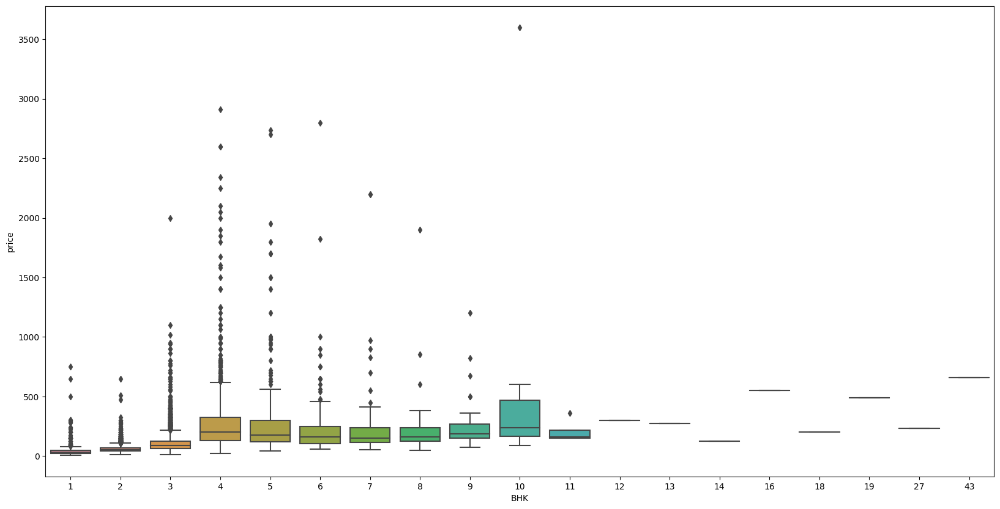

In [111]:
plt.figure(figsize=(20,10))
sns.boxplot(x= 'BHK', y='price', data= df)

<Axes: xlabel='BHK', ylabel='bath'>

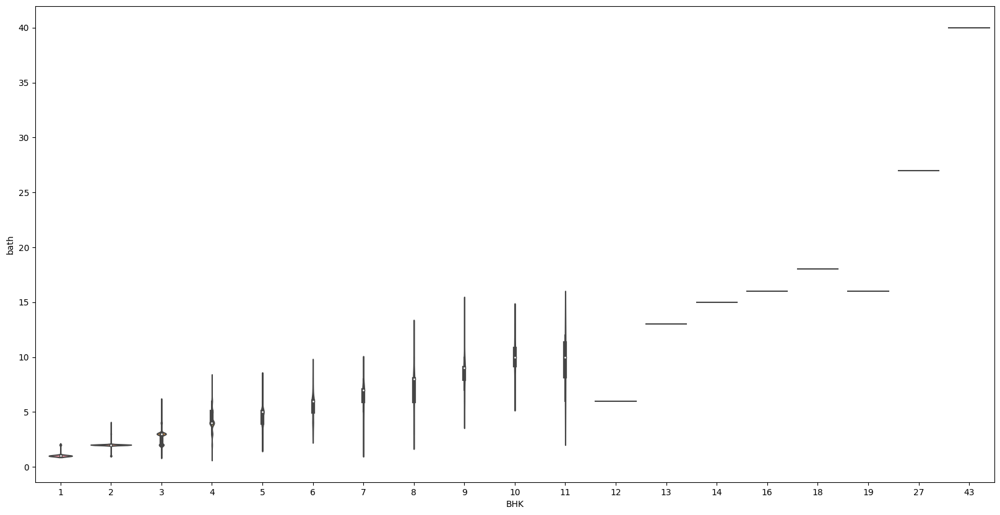

In [112]:
plt.figure(figsize=(20,10))
sns.violinplot(x ='BHK', y='bath', data=df)

In [113]:
def isfloat(x):
    try:
        float(x)
    except:
        return False
    return True

In [114]:
df[~df['total_sqft'].apply(isfloat)]

,location,size,total_sqft,bath,price,BHK
30,Yelahanka,4 BHK,2100 - 2850,4.0,186.000,4
122,Hebbal,4 BHK,3067 - 8156,4.0,477.000,4
137,8th Phase JP Nagar,2 BHK,1042 - 1105,2.0,54.005,2
165,Sarjapur,2 BHK,1145 - 1340,2.0,43.490,2
188,KR Puram,2 BHK,1015 - 1540,2.0,56.800,2
410,Kengeri,1 BHK,34.46Sq. Meter,1.0,18.500,1
549,Hennur Road,2 BHK,1195 - 1440,2.0,63.770,2
648,Arekere,9 Bedroom,4125Perch,9.0,265.000,9
661,Yelahanka,2 BHK,1120 - 1145,2.0,48.130,2
672,Bettahalsoor,4 Bedroom,3090 - 5002,4.0,445.000,4


Based on the above information provided, it is observed that the "total_sqft" column can contain a range of values, such as "2100-2850". In these cases, it is suggested to calculate the average by taking the mean of the minimum and maximum values in the range. However, there are also instances where the values are in different units, such as "34.46 Sq. Meter", which can be converted to square feet using unit conversion. To simplify the analysis, it is recommended to exclude these unusual cases.

In [115]:
def convert_sqft_to_num(x):
    token = x.split('-')
    if len(token) == 2:
        return (float(token[0]) + float(token[1]))/2
    try:
        return float(x)
    except:
        None

In [116]:
df = df.copy()
df['total_sqft'] = df['total_sqft'].apply(convert_sqft_to_num)


In [117]:
df

,location,size,total_sqft,bath,price,BHK
0,Electronic City Phase II,2 BHK,1056.000,2.0,39.070,2
1,Chikka Tirupathi,4 Bedroom,2600.000,5.0,120.000,4
2,Uttarahalli,3 BHK,1440.000,2.0,62.000,3
3,Lingadheeranahalli,3 BHK,1521.000,3.0,95.000,3
4,Kothanur,2 BHK,1200.000,2.0,51.000,2
5,Whitefield,2 BHK,1170.000,2.0,38.000,2
6,Old Airport Road,4 BHK,2732.000,4.0,204.000,4
7,Rajaji Nagar,4 BHK,3300.000,4.0,600.000,4
8,Marathahalli,3 BHK,1310.000,3.0,63.250,3
9,Gandhi Bazar,6 Bedroom,1020.000,6.0,370.000,6


In [118]:
df.loc[30]

location      Yelahanka
size              4 BHK
total_sqft       2475.0
bath                4.0
price             186.0
BHK                   4
Name: 30, dtype: object

Add new feature called price per square feet

In [120]:
df = df.copy()
df['price_per_sqft'] = df['price']*1e5/df['total_sqft']


Here, we are going to use Dimentionality Reduction for the data which are categorical variable. We need to apply Dimensionality Reduction here to reduce number of locations.

In [121]:
df.location = df.location.apply(lambda x: x.strip())
location_stats = df.groupby('location')['location'].agg('count').sort_values(ascending = False)
location_stats

location
Whitefield                                            535
Sarjapur  Road                                        392
Electronic City                                       304
Kanakpura Road                                        266
Thanisandra                                           236
Yelahanka                                             210
Uttarahalli                                           186
Hebbal                                                176
Marathahalli                                          175
Raja Rajeshwari Nagar                                 171
Bannerghatta Road                                     152
Hennur Road                                           150
7th Phase JP Nagar                                    149
Haralur Road                                          141
Electronic City Phase II                              131
Rajaji Nagar                                          106
Chandapura                                             98
Bella

In [123]:
len(location_stats[location_stats <= 10])
location_stats_less_than_10 = location_stats[location_stats <= 10]

location_stats_less_than_10 = location_stats[location_stats <= 10]

df.location = df.location.apply(lambda x: 'other' if x in location_stats_less_than_10 else x)

In [124]:
len(df.location.unique())

242

Here we will discard some more data. Because, normally if a square ft per bedroom is 300 (i.e. 2 bhk apartment is minimum 600 sqft). If you have for example 400 sqft apartment with 2 bhk than that seems suspicious and can be removed as an outlier. We will remove such outliers by keeping our minimum thresold per bhk to be 300 sqft



In [125]:
df[df.total_sqft/df.BHK<300]

,location,size,total_sqft,bath,price,BHK,price_per_sqft
9,other,6 Bedroom,1020.0,6.0,370.00,6,3.627451e+04
45,HSR Layout,8 Bedroom,600.0,9.0,200.00,8,3.333333e+04
58,Murugeshpalya,6 Bedroom,1407.0,4.0,150.00,6,1.066098e+04
68,Devarachikkanahalli,8 Bedroom,1350.0,7.0,85.00,8,6.296296e+03
70,other,3 Bedroom,500.0,3.0,100.00,3,2.000000e+04
78,Kaval Byrasandra,2 BHK,460.0,1.0,22.00,2,4.782609e+03
89,Rajaji Nagar,6 Bedroom,710.0,6.0,160.00,6,2.253521e+04
119,Hennur Road,2 Bedroom,276.0,3.0,23.00,2,8.333333e+03
129,Vishwapriya Layout,7 Bedroom,950.0,7.0,115.00,7,1.210526e+04
149,other,6 Bedroom,1034.0,5.0,185.00,6,1.789168e+04


In [126]:
df= [~(df.total_sqft/df.BHK<300)]
df

[0         True
 1         True
 2         True
 3         True
 4         True
 5         True
 6         True
 7         True
 8         True
 9        False
 10        True
 11        True
 12        True
 13        True
 14        True
 15        True
 16        True
 17        True
 18        True
 19        True
 20        True
 21        True
 22        True
 23        True
 24        True
 25        True
 26        True
 27        True
 28        True
 29        True
 30        True
 31        True
 32        True
 33        True
 34        True
 35        True
 36        True
 37        True
 38        True
 39        True
 40        True
 41        True
 42        True
 43        True
 44        True
 45       False
 46        True
 47        True
 48        True
 49        True
 50        True
 51        True
 52        True
 53        True
 54        True
 55        True
 57        True
 58       False
 59        True
 60        True
 61        True
 62        True
 63     